In [1]:
3# importing the necessary libraries:
import warnings
warnings.filterwarnings("ignore")
import anndata as ad
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import leidenalg
import scipy.sparse as sp
import math
import gseapy as gp

In [2]:
neu = sc.read("../data/merged_neu_with_blob.h5ad")

In [3]:
# Subset to Effector neutrophils
e_neu = neu[neu.obs["blob"] == "Effector"].copy()
print(e_neu.shape)

(20353, 27429)


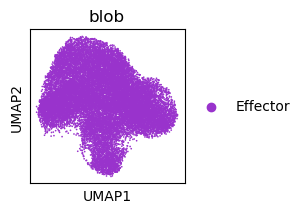

In [4]:
fig, ax = plt.subplots(figsize=(2, 2))
sc.pl.umap(
    e_neu,
    color="blob",
    palette={
        "Effector": "#9933CC",
    },
    ax=ax,
show = True)

** recompute Leiden **

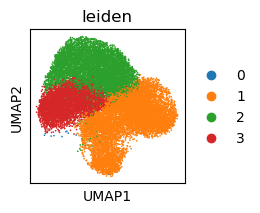

In [5]:
fig, ax = plt.subplots(figsize=(2, 2))
sc.pl.umap(
    e_neu,
    color="leiden",
    ax=ax,
show = True)

In [6]:
# Leiden clustering
sc.tl.leiden(e_neu, resolution=0.3, random_state=0)

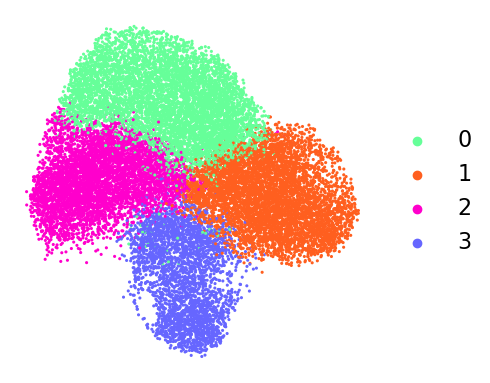

In [7]:
fig, ax = plt.subplots(figsize=(5, 5))
sc.pl.umap(
    e_neu,
    color="leiden",
    palette={
        "0": "#66FF99",
        "1": "#FF5F1F",
        "2" : "#FF00CC",
        "3" : "#6666FF"
    },
    size=20,
    ax=ax,na_in_legend=True,
    legend_fontsize=16,legend_fontoutline=2,
    add_outline=False,
    show=False
)
ax.set(xlabel="", ylabel="")
ax.title.set_visible(False)
ax.set_axis_off()
ax.set_aspect(1.0)
fig.tight_layout()
plt.show()

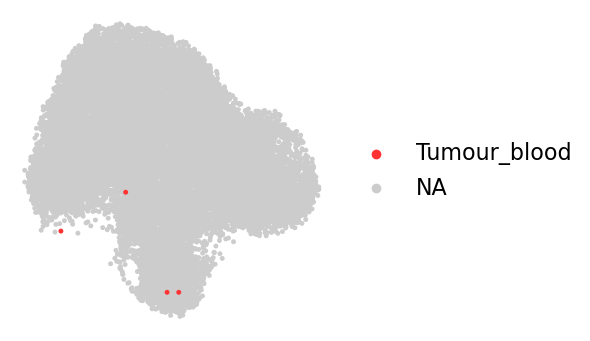

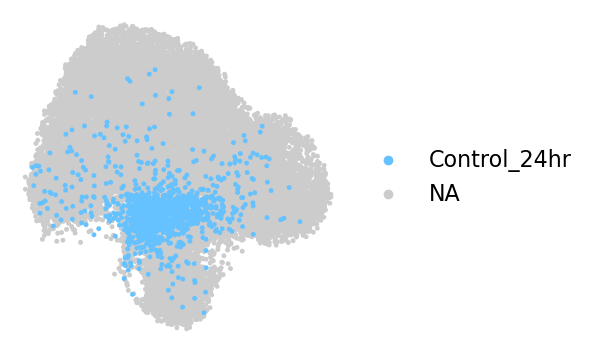

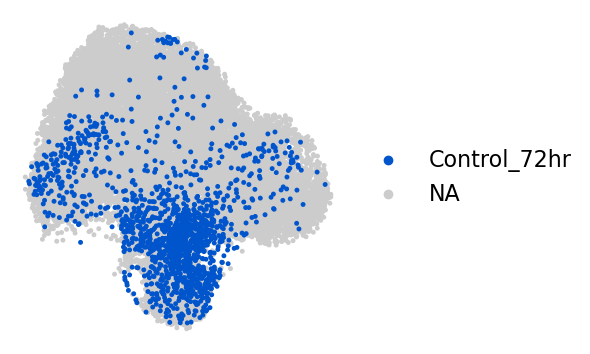

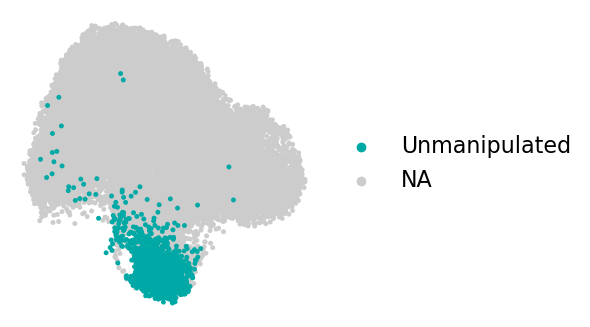

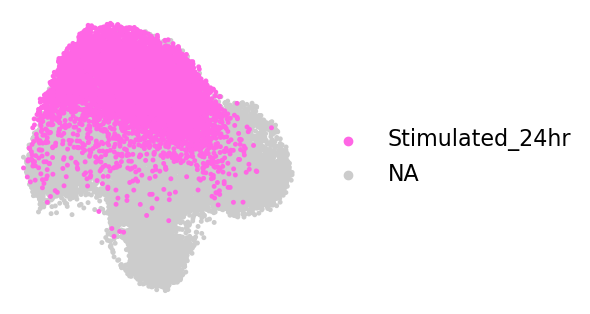

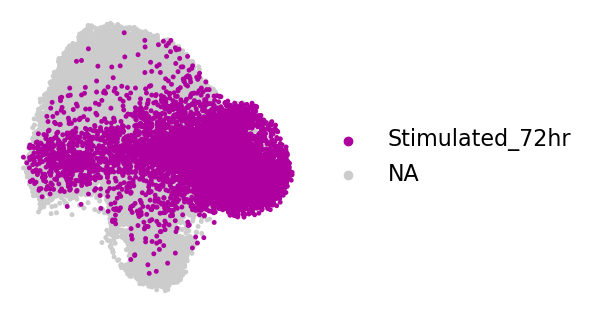

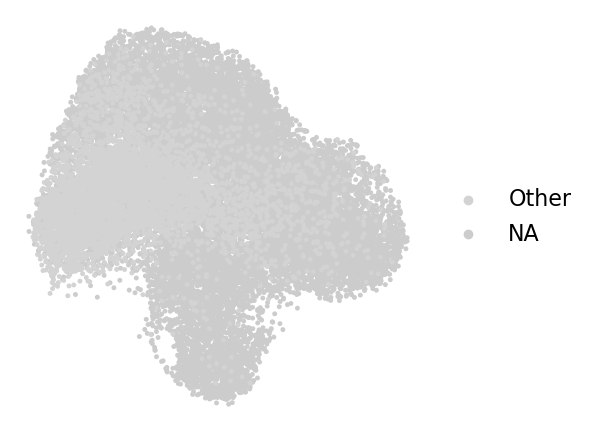

In [8]:
cats = list(e_neu.obs["batch"].cat.categories)
for b in cats:
    fig, ax = plt.subplots(figsize=(6, 6))
    sc.pl.umap(
        e_neu,
        color="batch",
        groups=[b],
        na_color="#CCCCCC",
        wspace=0.4, size=50, 
        ax=ax,na_in_legend=True,
        legend_fontsize=16,legend_fontoutline=2,
        add_outline=False,
        show=False
    )
    ax.set(xlabel="", ylabel="")
    ax.title.set_visible(False)
    ax.set_axis_off()
    ax.set_aspect(1.0)
    fig.tight_layout()
plt.show()

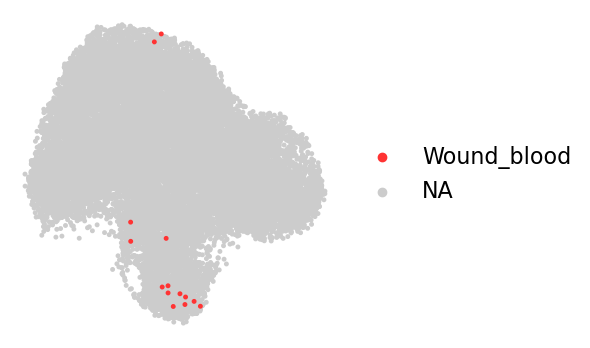

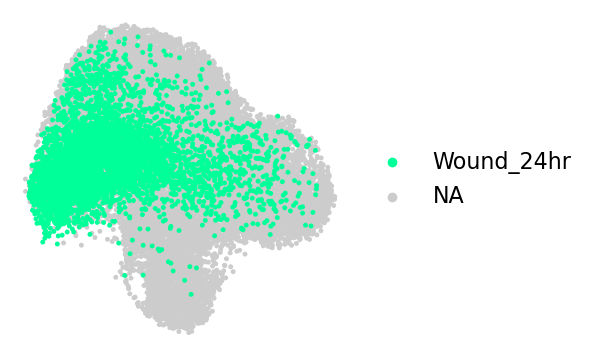

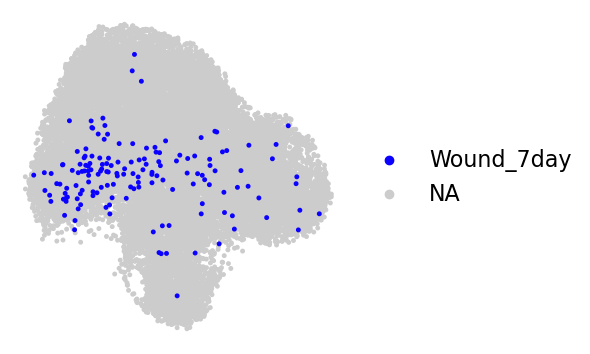

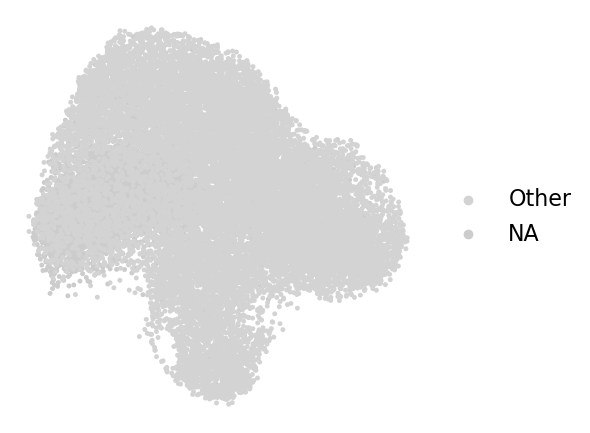

In [9]:
cats = list(e_neu.obs["time_point"].cat.categories)
for w in cats:
    fig, ax = plt.subplots(figsize=(6, 6))
    sc.pl.umap(
        e_neu,
        color="time_point",
        groups=[w],
        na_color="#CCCCCC",
        wspace=0.4, size=50, 
        ax=ax,na_in_legend=True,
        legend_fontsize=16,legend_fontoutline=2,
        add_outline=False,
        show=False
    )
    ax.set(xlabel="", ylabel="")
    ax.title.set_visible(False)
    ax.set_axis_off()
    ax.set_aspect(1.0)
    fig.tight_layout()
plt.show()

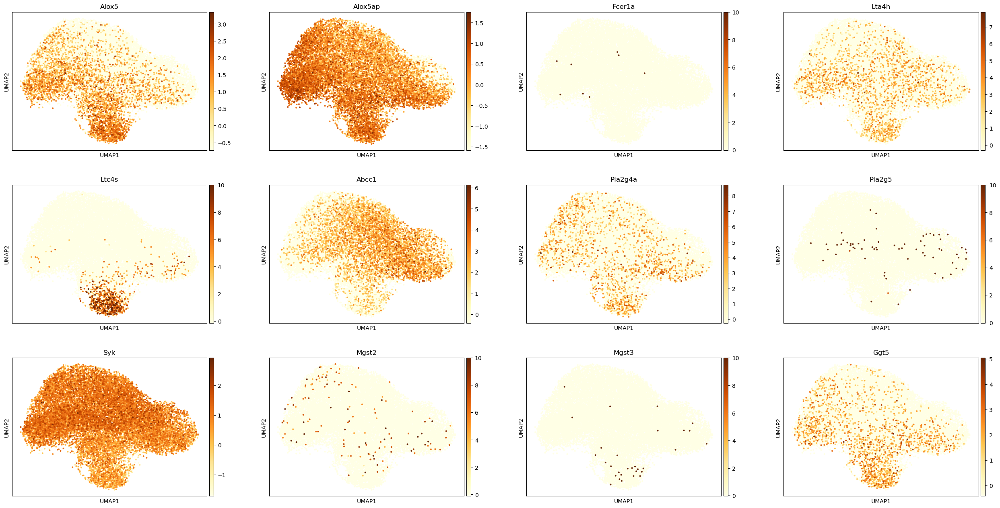

In [10]:
sc.pl.umap( e_neu, 
               color=['Alox5', 'Alox5ap', 'Fcer1a', 'Lta4h', 'Ltc4s', 'Abcc1', 'Pla2g4a', 'Pla2g5','Syk','Mgst2','Mgst3','Ggt5'], 
               groups=[b], na_color="#CCCCCC", cmap='YlOrBr',
               wspace=0.2, size=33, legend_fontsize=16, show=True )

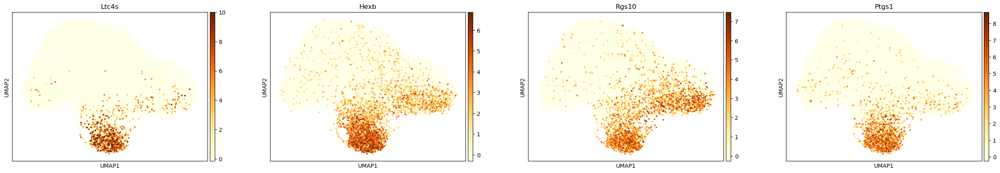

In [11]:
sc.pl.umap( e_neu, 
               color=['Ltc4s', 'Hexb', 'Rgs10', 'Ptgs1'], 
               groups=[b], na_color="#CCCCCC", cmap='YlOrBr',
               wspace=0.2, size=33, legend_fontsize=16, show=True )

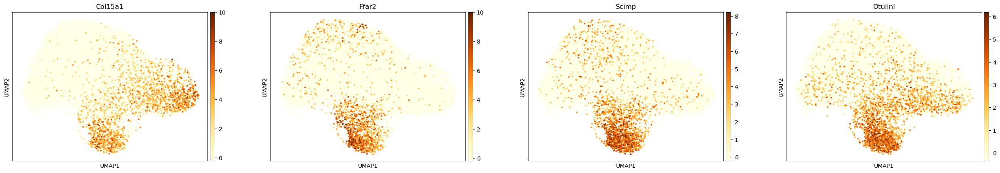

In [12]:
sc.pl.umap( e_neu, 
               color=['Col15a1', 'Ffar2', 'Scimp', 'Otulinl', ], 
               groups=[b], na_color="#CCCCCC", cmap='YlOrBr',
               wspace=0.2, size=33, legend_fontsize=16, show=True )

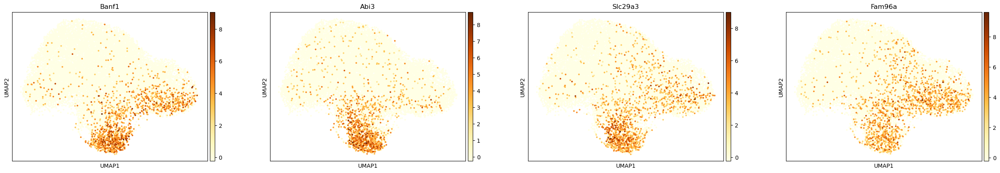

In [13]:
sc.pl.umap( e_neu, 
               color=['Banf1', 'Abi3', 'Slc29a3', 'Fam96a'], 
               groups=[b], na_color="#CCCCCC", cmap='YlOrBr',
               wspace=0.2, size=33, legend_fontsize=16, show=True )

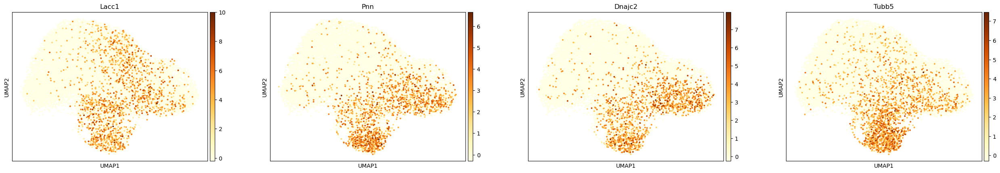

In [14]:
sc.pl.umap( e_neu, 
               color=['Lacc1', 'Pnn', 'Dnajc2', 'Tubb5'], 
               groups=[b], na_color="#CCCCCC", cmap='YlOrBr',
              wspace=0.2, size=33, legend_fontsize=16, show=True )

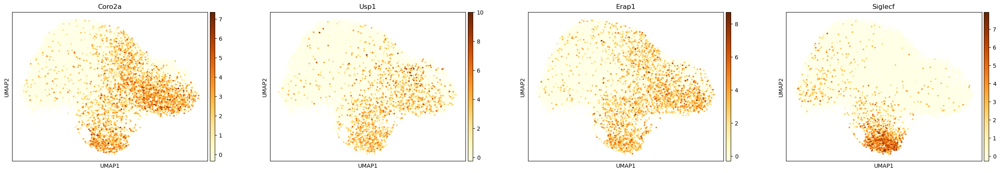

In [15]:
sc.pl.umap( e_neu, 
               color=['Coro2a', 'Usp1', 'Erap1', 'Siglecf'], 
               groups=[b], na_color="#CCCCCC", cmap='YlOrBr',
               wspace=0.2, size=33, legend_fontsize=16, show=True )

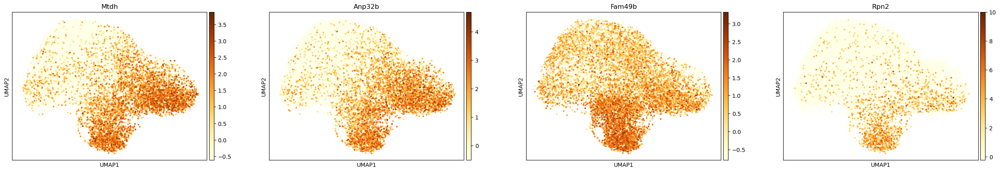

In [16]:
sc.pl.umap( e_neu, 
               color=['Mtdh', 'Anp32b', 'Fam49b', 'Rpn2'], 
               groups=[b], na_color="#CCCCCC", cmap='YlOrBr',
               wspace=0.2, size=33, legend_fontsize=16, show=True )

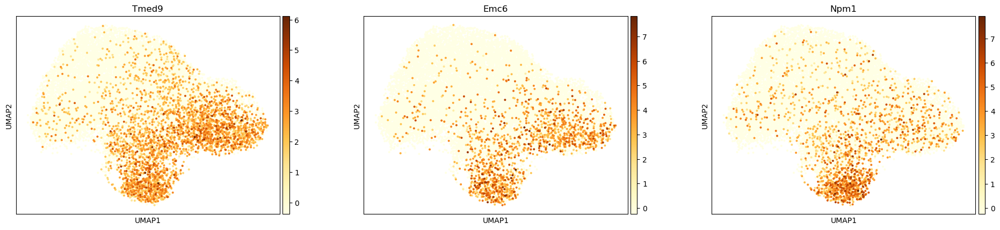

In [17]:
sc.pl.umap( e_neu, 
               color=['Tmed9', 'Emc6', 'Npm1'], 
               groups=[b], na_color="#CCCCCC", cmap='YlOrBr',
               wspace=0.2, size=33, legend_fontsize=16, show=True )

In [11]:
e_neu.obs["leiden"]
e_neu.obs["leiden"].value_counts()

leiden
0    6276
1    5705
2    5271
3    3101
Name: count, dtype: int64

In [12]:
# Subset first
wt = e_neu[e_neu.obs["leiden"].isin(["2","3"])].copy()
print("\nCounts after subsetting:\n", wt.obs["leiden"].value_counts())


Counts after subsetting:
 leiden
2    5271
3    3101
Name: count, dtype: int64


In [13]:
# Counts of batches per Leiden cluster
batch_counts = wt.obs.groupby(["leiden", "batch"]).size().unstack(fill_value=0)
print("Batch counts per Leiden:\n", batch_counts)

# Counts of time_point per Leiden cluster
time_counts = wt.obs.groupby(["leiden", "time_point"]).size().unstack(fill_value=0)
print("\nTime point counts per Leiden:\n", time_counts)

Batch counts per Leiden:
 batch   Tumour_blood  Control_24hr  Control_72hr  Unmanipulated  \
leiden                                                            
2                  1           129           240             23   
3                  3           732           987           1021   

batch   Stimulated_24hr  Stimulated_72hr  Other  
leiden                                           
2                   528              908   3442  
3                    42              230     86  

Time point counts per Leiden:
 time_point  Wound_blood  Wound_24hr  Wound_7day  Other
leiden                                                
2                     0        3344          98   1829
3                    12          65           9   3015


In [14]:
wt.obs["neutro_type"] = wt.obs["leiden"].replace({
    "2": "Wound-like",
    "3": "Tumour-like"
})


In [15]:
wt.write("wt.h5ad")

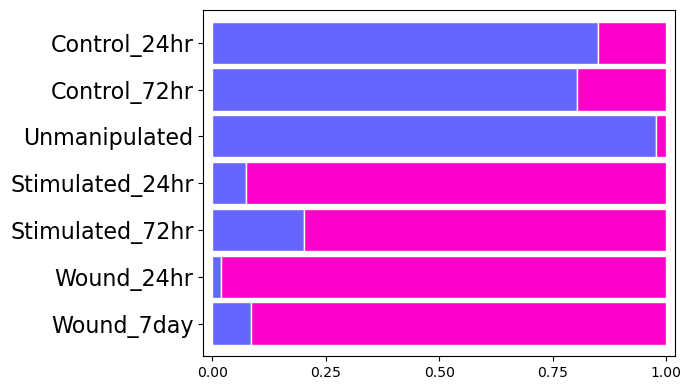

In [16]:
data = {
   
    "Wound-like": {"Control_24hr":129 , "Control_72hr":240, "Unmanipulated":23,
                    "Stimulated_24hr":528 , "Stimulated_72hr":908,
                    "Wound_24hr": 3344, "Wound_7day": 98},
     "Tumour-like": {"Control_24hr":732, "Control_72hr":987 , "Unmanipulated":1021,
                  "Stimulated_24hr":42, "Stimulated_72hr":230, 
                 "Wound_24hr": 65, "Wound_7day": 9}
}

order = ["Control_24hr","Control_72hr","Unmanipulated",
         "Stimulated_24hr","Stimulated_72hr",
        "Wound_24hr","Wound_7day"]

# Build DF in your desired row order
df = pd.DataFrame(data).reindex(order)

# (optional) also fix column order to match your colors
col_order = ["Tumour-like", "Wound-like"]
fractions = df[col_order].div(df.sum(axis=1), axis=0)

ax = fractions.plot(
    kind="barh", stacked=True, figsize=(7,4), width=0.9, edgecolor="white",
    color=["#6666FF","#FF00CC"]  # Tumour-like, Wound-like
)

# Put the first row at the TOP
ax.invert_yaxis()

# Step 5: Style 
ax.set_xlim(0, 1) 
ax.set_xticks([0.0, 0.25, 0.5, 0.75, 1.0]) 
ax.set_xticklabels(['0.00', '0.25', '0.50', '0.75', '1.00']) 
ax.set_xlim(-0.02, 1.02)
ax.tick_params(axis='y', labelsize=16) 
# Clean layout 
ax.set_xlabel('')
ax.set_ylabel('') 
ax.set_title('') 
ax.legend().remove() 
plt.tight_layout() 
plt.show()

In [17]:
wt.uns['neutro_type_colors'] = ["#FF00CC", "#6666FF"]

In [18]:
# (optional) quick check that the layer exists
if "log1p" not in wt.layers:
    raise ValueError("Missing 'log1p' layer. Create it or choose another layer.")

In [19]:
# Run DE
sc.tl.rank_genes_groups(
    wt,
    groupby="neutro_type",
    method="wilcoxon",
    use_raw=False,
    layer="log1p"
)

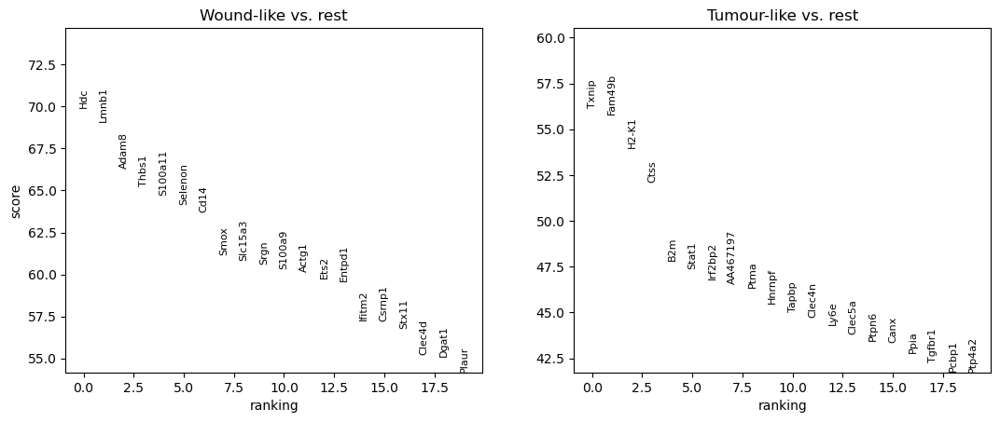

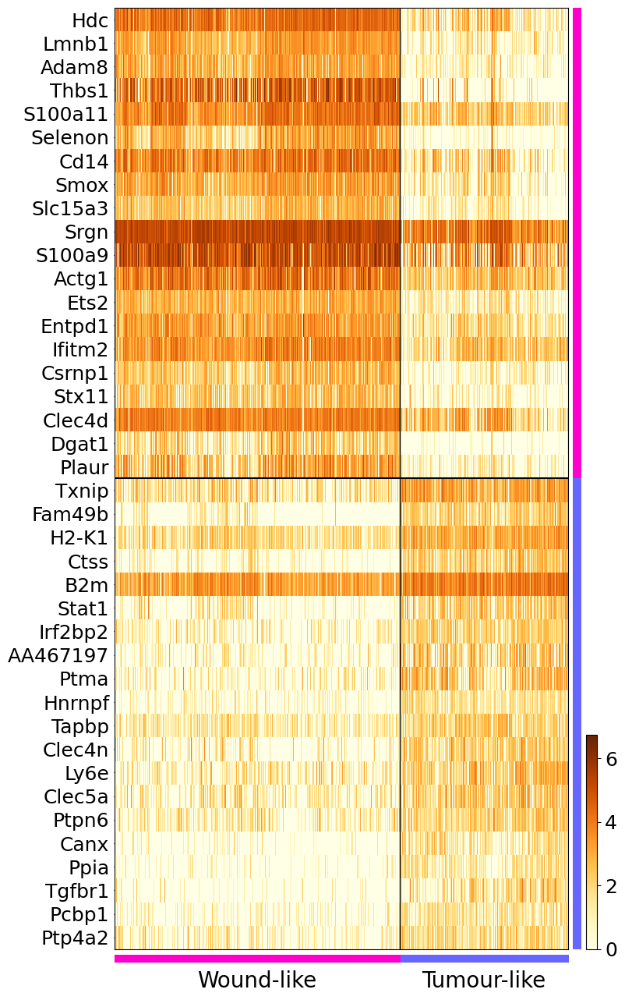

In [20]:
# First copy the categories
#palette = {"Wound-like": "#990066", "Tumour-like": "#CC9999"}
# 3) Quick plots
sc.pl.rank_genes_groups(wt, n_genes=20, sharey=False, show=False)
plt.show()
sc.pl.rank_genes_groups_heatmap(
    wt,
    n_genes=20,
    groupby='neutro_type',
    swap_axes=True,
    cmap="YlOrBr",
    dendrogram=False,
    show_gene_labels=True,
    use_raw=False,
    layer="log1p",
    figsize=(8, 16),
    show=False
)


fig = plt.gcf()
for ax in fig.axes:
    if ax.get_xticklabels():
        ax.set_xticklabels(ax.get_xticklabels(), rotation=0, ha='center', fontsize=20)
    if ax.get_ylabel() == '':
        ax.tick_params(axis='y', labelsize=18)
    if ax.get_xlabel() == "neutro_type":
        ax.set_xlabel("")
axes = fig.get_axes()
axes[0].axhline(19.5, color="black")
#axes[0].axvline(6350.5, color="black", linewidth=0.7)
plt.tight_layout()
plt.show()

In [21]:
# Tidy tables → save all + significant only (FDR < 0.05)
de_all_wt = sc.get.rank_genes_groups_df(wt, group=None)
de_all_wt.to_csv("DE_all_wt_groups.csv", index=False)

de_sig_wt = de_all_wt[de_all_wt["pvals_adj"] < 0.001]
de_sig_wt.to_csv("DE_all_groups_wt_significant.csv", index=False)

print("\nRows in DE_all_wt:", len(de_all_wt))
print("Rows in DE_all_wt_significant (FDR<0.001):", len(de_sig_wt))


Rows in DE_all_wt: 54858
Rows in DE_all_wt_significant (FDR<0.001): 11398


In [22]:
filtered_de = de_all_wt[
    (de_all_wt["pvals_adj"] < 0.05) &             # Statistically significant
    (abs(de_all_wt["logfoldchanges"]) > 0.25)     # Biologically meaningful effect
]
print("Rows in filtered_de:", len(filtered_de))
filtered_de.to_csv("filtered_de.csv", index=False)

Rows in filtered_de: 13544


In [23]:
filterrred_de = de_all_wt[
    (de_all_wt["pvals_adj"] < 0.001) &             # Statistically significant
    (abs(de_all_wt["logfoldchanges"]) > 1)     # Biologically meaningful effect
]
print("Rows in filtered_de:", len(filterrred_de))
filterrred_de.to_csv("filterrred_de.csv", index=False)

Rows in filtered_de: 9126


In [24]:
# Pick one TOP up-regulated gene for 'Effector'
deW = sc.get.rank_genes_groups_df(wt, group="Wound-like")
deW_up = deW[deW["logfoldchanges"] > 0].sort_values(
    ["pvals_adj", "scores"], ascending=[True, False]
)
top_gene_W = deW_up.iloc[0]["names"]
print("\nTop up gene for Wound-like:", top_gene_W)


Top up gene for Wound-like: Hdc


In [25]:
# 5) Pick one TOP up-regulated gene for 'Blood-like'
deT = sc.get.rank_genes_groups_df(wt, group="Tumour-like")
deT_up = deT[deT["logfoldchanges"] > 1].sort_values(
    ["pvals_adj", "scores"], ascending=[True, False]
)
top_gene_T = deT_up.iloc[0]["names"]
print("\nTop up gene for Tumour-like:", top_gene_T)


Top up gene for Tumour-like: Txnip


In [26]:
up_in_Wl = de_sig_wt.query("group == 'Wound-like' and logfoldchanges > 0")["names"].tolist()
up_in_Tl = de_sig_wt.query("group == 'Tumour-like' and logfoldchanges > 0")["names"].tolist()

genes_up_Wl = up_in_Wl[:150]
genes_up_Tl = up_in_Tl[:150]

print("Top Wound-like genes:", len(genes_up_Wl))
print("Top Tumour-like genes:", len(genes_up_Tl))

Top Wound-like genes: 150
Top Tumour-like genes: 150


In [27]:
# Run Enrichr
import gseapy as gp

enr_upW = gp.enrichr(
    gene_list=genes_up_Wl,
    gene_sets=["KEGG_2019_Mouse", "GO_Biological_Process_2023"],
    organism="mouse",
    outdir=None,
)

enr_upT = gp.enrichr(
    gene_list=genes_up_Tl,
    gene_sets=["KEGG_2019_Mouse", "GO_Biological_Process_2023"],
    organism="mouse",
    outdir=None,
)

In [28]:
# Extract and tidy the results
def extract_pathways(enr_result, gene_set_name, label, top_n=50):
    df = enr_result.results.copy()
    df = df[df["Gene_set"] == gene_set_name]
    df["-log10(FDR)"] = -np.log10(df["Adjusted P-value"].clip(lower=1e-300))
    
    # 🔹 Filter out weakly enriched pathways (FDR > 0.1)
    df = df[df["-log10(FDR)"] >= 1.5]
    
    # Keep only the top N most significant
    df = df.nsmallest(top_n, "Adjusted P-value")
    
    # Add condition label
    df["Condition"] = label
    return df

# KEGG
kegg_W = extract_pathways(enr_upW, "KEGG_2019_Mouse", "up in wound-like")
kegg_T = extract_pathways(enr_upT, "KEGG_2019_Mouse", "up in tumour-like")

# GO-BP
go_W = extract_pathways(enr_upW, "GO_Biological_Process_2023", "up in wound-like")
go_W["Term"] = go_W["Term"].str.replace(r"\s*\(GO:\d+\)", "", regex=True)

go_T = extract_pathways(enr_upT, "GO_Biological_Process_2023", "up in tumour-like")
go_T["Term"] = go_T["Term"].str.replace(r"\s*\(GO:\d+\)", "", regex=True)


In [29]:
# plotting
import seaborn as sns
palette = {"up in wound-like": "#FF00CC", "up in tumour-like": "#6666FF"}

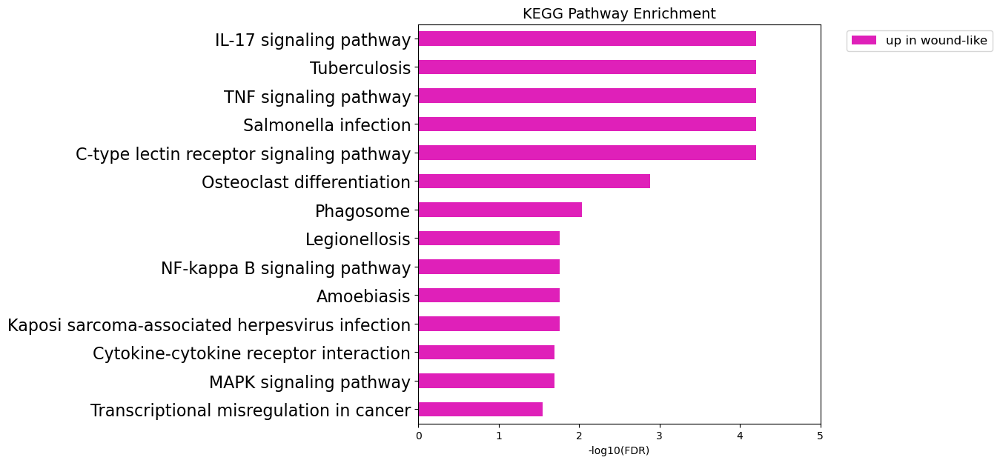

In [54]:
# --- KEGG: Up in Wound-like ---
plt.figure(figsize=(7, 7))
ax = sns.barplot(
    data=kegg_W,
    x="-log10(FDR)",
    y="Term",
    hue="Condition",
    palette=palette
)

# --- make bars thinner but keep them centred on the tick labels ---
new_h = 0.5  # bar thickness you want
for bar in ax.patches:
    old_y = bar.get_y()
    old_h = bar.get_height()
    center = old_y + old_h / 2.0      # current centre of the bar
    bar.set_height(new_h)             # new height
    bar.set_y(center - new_h / 2.0)   # move so centre stays the same
# ------------------------------------------------------------------

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
plt.title("KEGG Pathway Enrichment", fontsize=14)
plt.xlabel("-log10(FDR)", fontsize=10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=16)
plt.ylabel("")

xmax = ax.get_xlim()[1]
plt.xticks(ticks=np.arange(0, int(np.ceil(xmax)) + 0.1, 1), fontsize=10)

plt.show()

In [38]:
import re

# If you plotted kegg_T directly, this matches the plot
wbl = kegg_W[['Term', 'Condition', 'Genes']].drop_duplicates()
def split_genes(gene_string):
    """Split a gene list string from Enrichr/GSEApy results into a Python list."""
    if pd.isna(gene_string):
        return []
    # Split by comma, semicolon, or whitespace, and clean up spaces
    genes = re.split(r'[,; ]+', gene_string.strip())
    return [g for g in genes if g]
def to_mouse_case(gene):
    # If already proper (like 'Il1b'), leave it; otherwise convert
    return gene[0].upper() + gene[1:].lower() if gene else gene

for _, row in wbl.iterrows():
    genes = split_genes(row['Genes'])
    genes_mouse = [to_mouse_case(g) for g in genes]
    print(f"{row['Term']}  [{row['Condition']}]")
    print("  " + ", ".join(genes_mouse))

IL-17 signaling pathway  [up in wound-like]
  Cebpb, Jund, Il1b, Cxcl3, Ptgs2, Cxcl2, S100a9, S100a8
Tuberculosis  [up in wound-like]
  Plk3, Cebpb, Rab7, Syk, Clec7a, Il1b, Lamp2, Cd14, Clec4e, Atp6v0c
TNF signaling pathway  [up in wound-like]
  Map2k4, Socs3, Cebpb, Il1b, Cxcl3, Ptgs2, Junb, Cxcl2
Salmonella infection  [up in wound-like]
  Rab7, Arpc3, Il1b, Cd14, Cxcl3, Cxcl2, Actg1
C-type lectin receptor signaling pathway  [up in wound-like]
  Plk3, Clec4d, Syk, Clec7a, Il1b, Nlrp3, Clec4e, Ptgs2
Osteoclast differentiation  [up in wound-like]
  Socs3, Jund, Syk, Il1b, Lilrb4a, Junb, Fosl2
Phagosome  [up in wound-like]
  Rab7, Clec7a, Lamp2, Cd14, Atp6v0c, Thbs1, Actg1
Legionellosis  [up in wound-like]
  Il1b, Cd14, Cxcl3, Cxcl2
NF-kappa B signaling pathway  [up in wound-like]
  Syk, Il1b, Cd14, Ptgs2, Cxcl2
Amoebiasis  [up in wound-like]
  Rab7, Arg2, Lamb3, Il1b, Cd14
Kaposi sarcoma-associated herpesvirus infection  [up in wound-like]
  Ccr1, Map2k4, Cdkn1a, Syk, Cxcl3, Ptgs2, Cxc

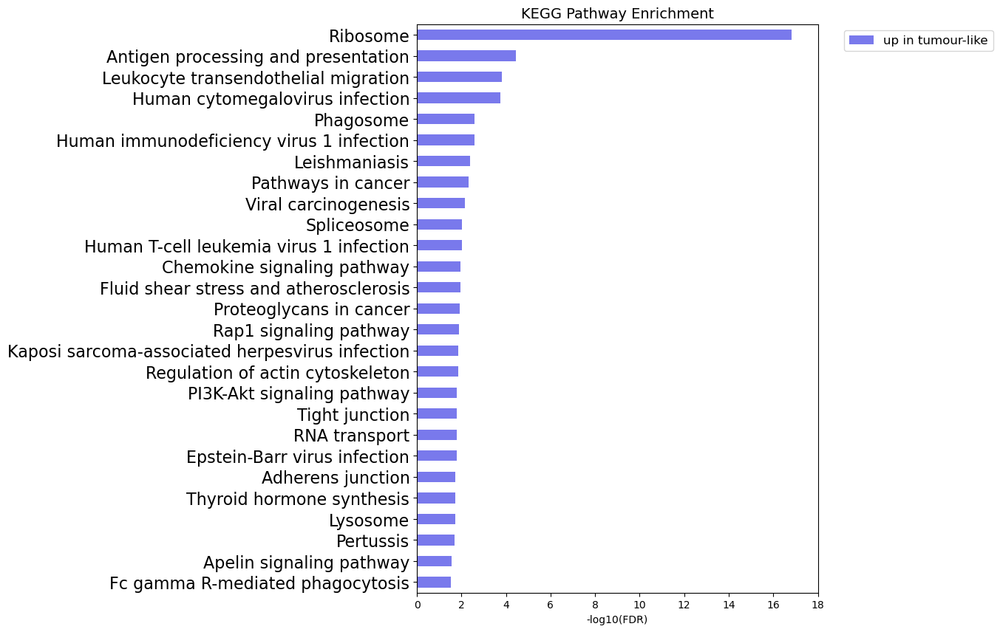

In [53]:
# --- KEGG: Up in Tumour-like ---
plt.figure(figsize=(7, 10))
ax = sns.barplot(
    data=kegg_T,
    x="-log10(FDR)",
    y="Term",
    hue="Condition",
    palette=palette
)

# --- make bars thinner but keep them centred on the tick labels ---
new_h = 0.5  # bar thickness you want
for bar in ax.patches:
    old_y = bar.get_y()
    old_h = bar.get_height()
    center = old_y + old_h / 2.0      # current centre of the bar
    bar.set_height(new_h)             # new height
    bar.set_y(center - new_h / 2.0)   # move so centre stays the same
# ------------------------------------------------------------------

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
plt.title("KEGG Pathway Enrichment", fontsize=14)
plt.xlabel("-log10(FDR)", fontsize=10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=16)
plt.ylabel("")

xmax = ax.get_xlim()[1]
plt.xticks(ticks=np.arange(0, int(np.ceil(xmax)) + 0.1, 2), fontsize=10)

plt.show()

In [40]:
print(kegg_T.columns)

Index(['Gene_set', 'Term', 'Overlap', 'P-value', 'Adjusted P-value',
       'Old P-value', 'Old Adjusted P-value', 'Odds Ratio', 'Combined Score',
       'Genes', '-log10(FDR)', 'Condition'],
      dtype='object')


In [41]:
import re

# If you plotted kegg_T directly, this matches the plot
tbl = kegg_T[['Term', 'Condition', 'Genes']].drop_duplicates()
def split_genes(gene_string):
    """Split a gene list string from Enrichr/GSEApy results into a Python list."""
    if pd.isna(gene_string):
        return []
    # Split by comma, semicolon, or whitespace, and clean up spaces
    genes = re.split(r'[,; ]+', gene_string.strip())
    return [g for g in genes if g]
def to_mouse_case(gene):
    # If already proper (like 'Il1b'), leave it; otherwise convert
    return gene[0].upper() + gene[1:].lower() if gene else gene

for _, row in tbl.iterrows():
    genes = split_genes(row['Genes'])
    genes_mouse = [to_mouse_case(g) for g in genes]
    print(f"{row['Term']}  [{row['Condition']}]")
    print("  " + ", ".join(genes_mouse))


Ribosome  [up in tumour-like]
  Rpl4, Rpl5, Rpl30, Rpl32, Rps8, Rpl31, Rpl34, Rps6, Rpl35a, Rpl23a, Rpl6, Rps26, Rps25, Rps28, Rps17, Rps3a1, Rps20, Rpl38, Rpl26, Rps11, Rpl17
Antigen processing and presentation  [up in tumour-like]
  Pdia3, H2-k1, Canx, Tap1, Psme2, B2m, Ctss, Tapbp
Leukocyte transendothelial migration  [up in tumour-like]
  Vasp, Itgb1, Cdc42, Ncf1, Msn, Cxcr4, Rhoa, Icam1
Human cytomegalovirus infection  [up in tumour-like]
  Pdia3, Gngt2, H2-k1, Gnb1, Tap1, Cxcr4, Calm2, B2m, Rhoa, Creb5, Tapbp
Phagosome  [up in tumour-like]
  C3, Itgb1, Ncf1, H2-k1, Canx, M6pr, Tap1, Ctss
Human immunodeficiency virus 1 infection  [up in tumour-like]
  Pdia3, Gngt2, H2-k1, Gnb1, Tap1, Cxcr4, Calm2, B2m, Tapbp
Leishmaniasis  [up in tumour-like]
  Itgb1, C3, Ncf1, Stat1, Ptpn6
Pathways in cancer  [up in tumour-like]
  Itgb1, Egln3, Stat1, Pten, Cxcr4, Rhoa, Tgfbr1, Hsp90b1, Cdc42, Gngt2, Gnb1, Tpr, Calm2
Viral carcinogenesis  [up in tumour-like]
  C3, Cdc42, Gsn, Hnrnpk, H2-k1, Rhoa,

In [42]:
print(go_W.columns)

Index(['Gene_set', 'Term', 'Overlap', 'P-value', 'Adjusted P-value',
       'Old P-value', 'Old Adjusted P-value', 'Odds Ratio', 'Combined Score',
       'Genes', '-log10(FDR)', 'Condition'],
      dtype='object')


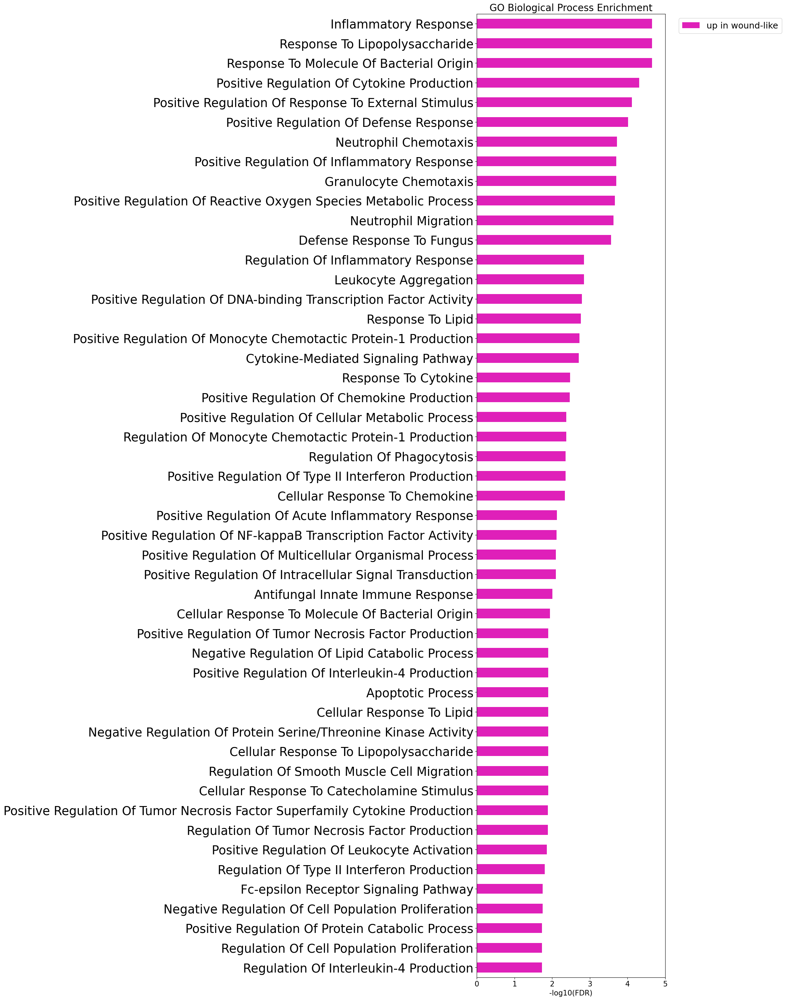

In [41]:
# Remove one or more unwanted pathways
remove_list = [
    "Positive Regulation Of Adaptive Immune Response Based On Somatic Recombination Of Immune Receptors Built From Immunoglobulin Superfamily Domains"
]
go_W = go_W[~go_W["Term"].isin(remove_list)]
# --- GO-BP: Up in Wound-like ---
plt.figure(figsize=(7, 36))
ax = sns.barplot(
    data=go_W,
    x="-log10(FDR)",
    y="Term",
    hue="Condition",
    palette=palette
)

# --- make bars thinner but keep them centred on the tick labels ---
new_h = 0.5  # bar thickness you want
for bar in ax.patches:
    old_y = bar.get_y()
    old_h = bar.get_height()
    center = old_y + old_h / 2.0      # current centre of the bar
    bar.set_height(new_h)             # new height
    bar.set_y(center - new_h / 2.0)   # move so centre stays the same
# ------------------------------------------------------------------

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=18)
plt.title("GO Biological Process Enrichment", fontsize=20)
plt.xlabel("-log10(FDR)", fontsize=15)
plt.ylabel("")
plt.xticks(fontsize=15)
plt.yticks(fontsize=25)

xmax = ax.get_xlim()[1]
plt.xticks(ticks=np.arange(0, int(np.ceil(xmax)) + 0.1, 1), fontsize=15)

plt.show()

In [44]:
import re

# If you plotted kegg_T directly, this matches the plot
w = go_W[['Term', 'Condition', 'Genes']].drop_duplicates()
def split_genes(gene_string):
    """Split a gene list string from Enrichr/GSEApy results into a Python list."""
    if pd.isna(gene_string):
        return []
    # Split by comma, semicolon, or whitespace, and clean up spaces
    genes = re.split(r'[,; ]+', gene_string.strip())
    return [g for g in genes if g]
def to_mouse_case(gene):
    # If already proper (like 'Il1b'), leave it; otherwise convert
    return gene[0].upper() + gene[1:].lower() if gene else gene

for _, row in w.iterrows():
    genes = split_genes(row['Genes'])
    genes_mouse = [to_mouse_case(g) for g in genes]
    print(f"{row['Term']}  [{row['Condition']}]")
    print("  " + ", ".join(genes_mouse))


Inflammatory Response  [up in wound-like]
  Ccr1, Cebpb, Slc11a1, Fpr1, Cxcl3, Cxcl2, Thbs1, Il1b, Nlrp3, Adam8, Cd14, S100a9, S100a8
Response To Lipopolysaccharide  [up in wound-like]
  Slpi, Slc11a1, Il1b, Pde4b, Nlrp3, Cd14, Cxcl3, Trib1, S100a9, Cxcl2, S100a8
Response To Molecule Of Bacterial Origin  [up in wound-like]
  Slpi, Slc11a1, Il1b, Cd14, Trib1, Cxcl2, S100a9, S100a8
Positive Regulation Of Cytokine Production  [up in wound-like]
  App, Egr1, Cebpb, Syk, Slc11a1, Osm, Ptgs2, Sorl1, Rgcc, Clec7a, Il1b, Pde4b, Nlrp3, Cd14
Positive Regulation Of Response To External Stimulus  [up in wound-like]
  App, Il1b, Nfkbiz, Osm, Acod1, Nlrp3, Adam8, S100a9, Thbs1, S100a8
Positive Regulation Of Defense Response  [up in wound-like]
  App, Il1b, Nfkbiz, Osm, Acod1, Nlrp3, Adam8, S100a9, S100a8
Neutrophil Chemotaxis  [up in wound-like]
  Syk, Pde4b, Cxcl3, Cxcl2, Trem1, S100a9, S100a8
Positive Regulation Of Inflammatory Response  [up in wound-like]
  App, Il1b, Nfkbiz, Osm, Nlrp3, Adam8, S

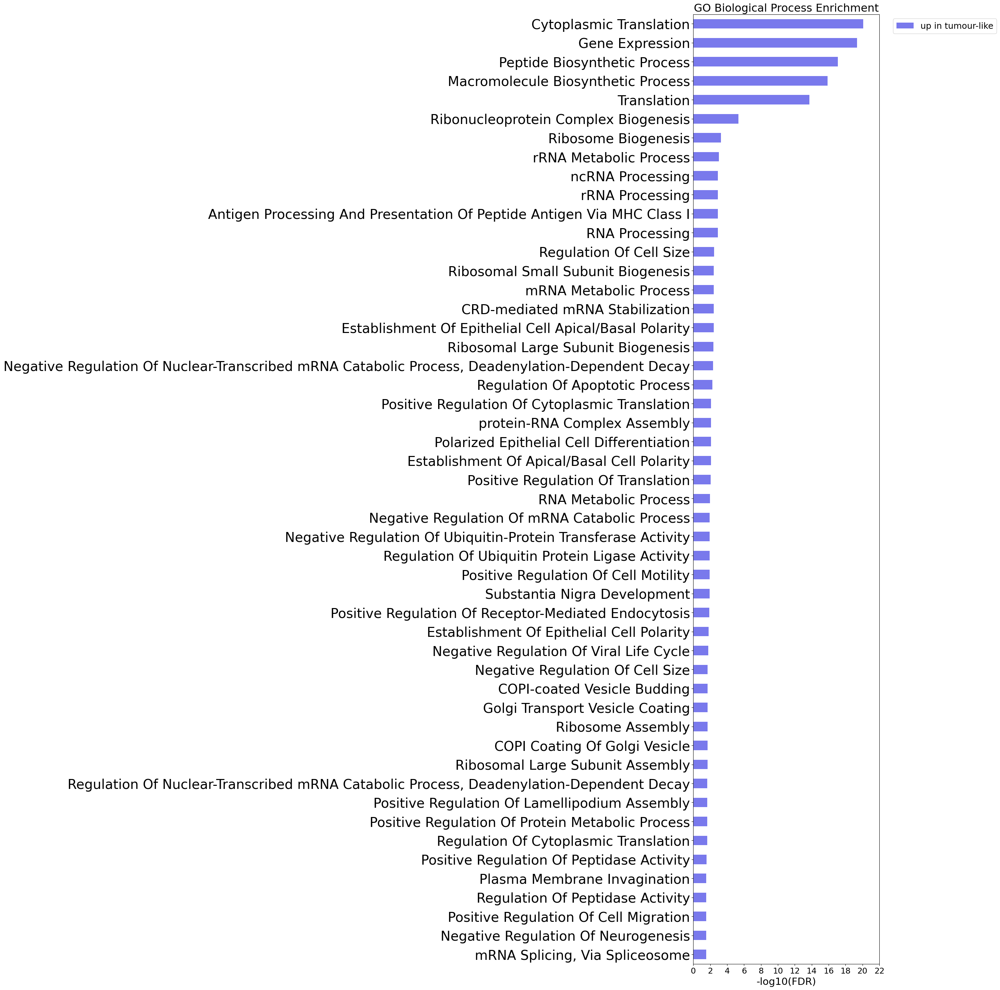

In [55]:
# --- GO-BP: Up in Tumour-like ---
remove_list = [
    "Negative Regulation Of Nuclear-Transcribed mRNA Catabolic Process, Deadenylation-Dependent Decay (GO:1900152)"
]
go_T = go_T[~go_T["Term"].isin(remove_list)]
# --- GO-BP: Up in Tumour-like ---
plt.figure(figsize=(7, 36))
ax = sns.barplot(
    data=go_T,
    x="-log10(FDR)",
    y="Term",
    hue="Condition",
    palette=palette
)

# --- make bars thinner but keep them centred on the tick labels ---
new_h = 0.5  # bar thickness you want
for bar in ax.patches:
    old_y = bar.get_y()
    old_h = bar.get_height()
    center = old_y + old_h / 2.0      # current centre of the bar
    bar.set_height(new_h)             # new height
    bar.set_y(center - new_h / 2.0)   # move so centre stays the same
# ------------------------------------------------------------------

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=18)
plt.title("GO Biological Process Enrichment", fontsize=23)
plt.xlabel("-log10(FDR)", fontsize=21)
plt.ylabel("")
plt.xticks(fontsize=23)
plt.yticks(fontsize=28)

xmax = ax.get_xlim()[1]
plt.xticks(ticks=np.arange(0, int(np.ceil(xmax)) + 0.1, 2), fontsize=17)

plt.show()

In [46]:
print(go_T.columns)

Index(['Gene_set', 'Term', 'Overlap', 'P-value', 'Adjusted P-value',
       'Old P-value', 'Old Adjusted P-value', 'Odds Ratio', 'Combined Score',
       'Genes', '-log10(FDR)', 'Condition'],
      dtype='object')


In [47]:
import re

# If you plotted kegg_T directly, this matches the plot
t = go_T[['Term', 'Condition', 'Genes']].drop_duplicates()

def to_mouse_case(gene):
    # If already proper (like 'Il1b'), leave it; otherwise convert
    return gene[0].upper() + gene[1:].lower() if gene else gene

for _, row in t.iterrows():
    genes = split_genes(row['Genes'])
    genes_mouse = [to_mouse_case(g) for g in genes]
    print(f"{row['Term']}  [{row['Condition']}]")
    print("  " + ", ".join(genes_mouse))

Cytoplasmic Translation  [up in tumour-like]
  Rpl4, Rpl5, Rpl30, Rpl32, Rpl31, Rps8, Rpl34, Rps6, Rpl35a, Rpl23a, Rpl6, Rps26, Rps25, Rps17, Rps28, Rpl38, Rps20, Rpl26, Rps11, Rpl17
Gene Expression  [up in tumour-like]
  Rpl4, Rpl5, Rpl30, Rpl32, Rpl31, Rpl34, Hnrnpu, Rpl6, Rbm3, Rps17, Alkbh5, Tpr, Rpl38, Rps11, Rpl17, Rps8, Rps6, Rpl35a, Rpl23a, Eef1a1, Rps26, Rps25, Rps28, Hnrnpk, Hnrnpf, Hnrnpd, Rps20, Rpl26
Peptide Biosynthetic Process  [up in tumour-like]
  Rpl4, Rpl5, Rpl30, Rpl32, Rps8, Rpl31, Rpl34, Rps6, Rpl35a, Rpl23a, Rpl6, Eef1a1, Rps26, Rps25, Rps28, Rps17, Rps20, Rpl38, Rpl26, Rps11, Rpl17
Macromolecule Biosynthetic Process  [up in tumour-like]
  Rpl4, Rpl5, Rpl30, Rpl32, Rps8, Rpl31, Rpl34, Rps6, Rpl35a, Rpl23a, Rpl6, Eef1a1, Rps26, Rps25, Rps28, Rps17, Rps20, Rpl38, Rpl26, Rps11, Rpl17
Translation  [up in tumour-like]
  Rpl4, Rpl5, Rpl30, Rpl32, Rps8, Rpl31, Rpl34, Rps6, Rpl35a, Rpl23a, Rpl6, Eef1a1, Rps26, Rps25, Rps28, Rps17, Rps20, Rpl38, Rpl26, Rps11, Rpl17
Ribonu

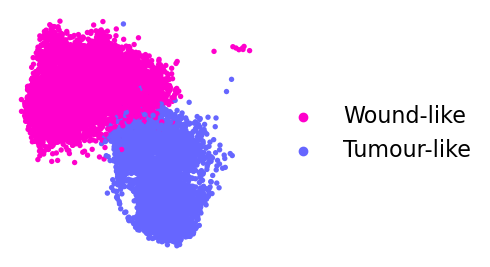

In [48]:
fig, ax = plt.subplots(figsize=(5, 5))
sc.pl.umap(
    wt,
    color="neutro_type",
    palette = {"Wound-like": "#FF00CC", "Tumour-like": "#6666FF"},
    size=60,
    ax=ax,na_in_legend=True,
    legend_fontsize=16,legend_fontoutline=2,
    add_outline=False,
    show=False
)
ax.set(xlabel="", ylabel="")
ax.title.set_visible(False)
ax.set_axis_off()
ax.set_aspect(1.0)
fig.tight_layout()
plt.show()

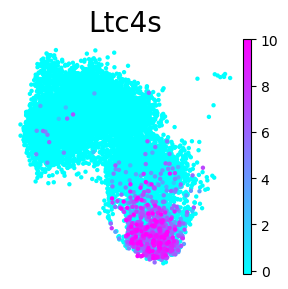

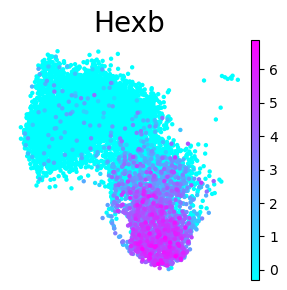

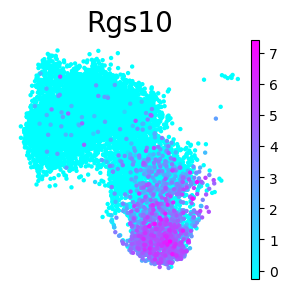

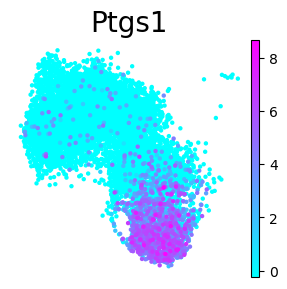

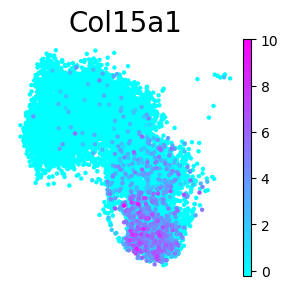

...

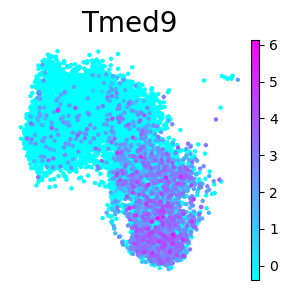

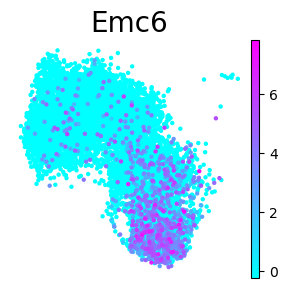

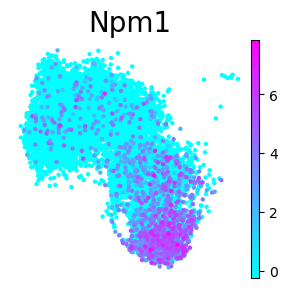

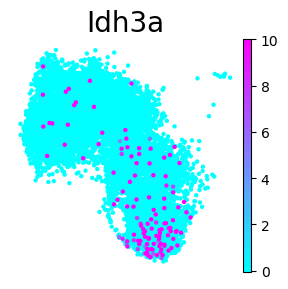

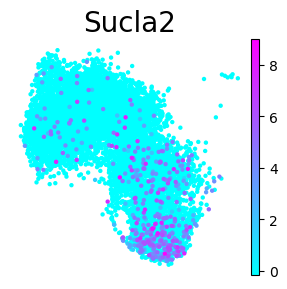

In [60]:
genes =['Ltc4s', 'Hexb', 'Rgs10', 'Ptgs1','Col15a1', 'Ffar2', 'Scimp', 'Otulinl', 
        'Banf1', 'Abi3', 'Slc29a3', 'Fam96a', 'Lacc1', 'Pnn', 'Dnajc2', 'Tubb5',
       'Coro2a', 'Usp1', 'Erap1', 'Siglecf', 'Mtdh', 'Anp32b', 'Fam49b', 'Rpn2',
       'Tmed9', 'Emc6', 'Npm1','Idh3a', 'Sucla2']
for gene in genes:
    # make a new figure of desired size
    fig, ax = plt.subplots(figsize=(3, 3))
    
    sc.pl.umap(
        wt,
        color=gene,             # one gene at a time
        groups=[b],
        na_color="#CCCCCC",
        cmap='cool',
        size=40,
        legend_fontsize=24,
        frameon=False,
        show=False,             # don’t show until we’re ready
        ax=ax                   # plot onto our axes
    )
    
    plt.title(gene, fontsize=20)
    plt.tight_layout()
    plt.show()                 # display the figure


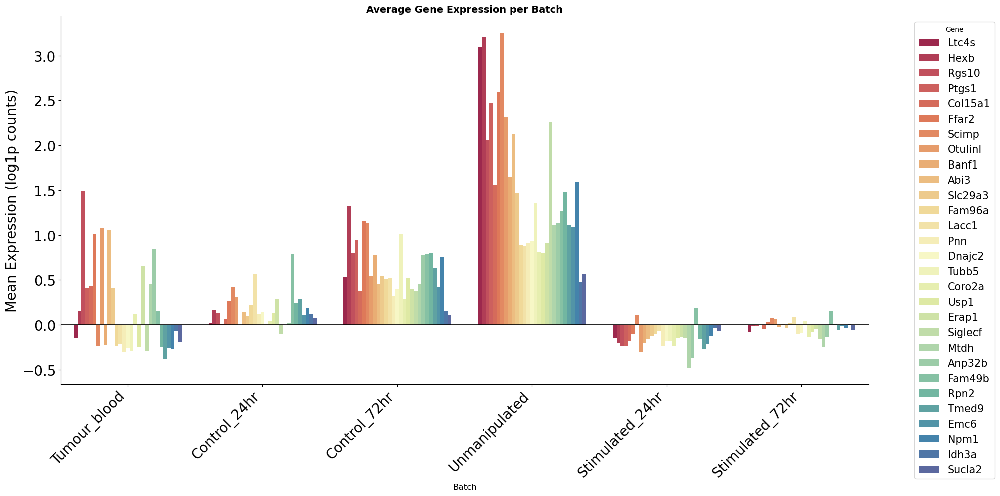

In [50]:
# --- Define your genes of interest ---
genes =['Ltc4s', 'Hexb', 'Rgs10', 'Ptgs1','Col15a1', 'Ffar2', 'Scimp', 'Otulinl', 
        'Banf1', 'Abi3', 'Slc29a3', 'Fam96a', 'Lacc1', 'Pnn', 'Dnajc2', 'Tubb5',
       'Coro2a', 'Usp1', 'Erap1', 'Siglecf', 'Mtdh', 'Anp32b', 'Fam49b', 'Rpn2',
       'Tmed9', 'Emc6', 'Npm1','Idh3a', 'Sucla2']

# --- Compute mean expression per cell for each gene ---
for gene in genes:
    wt.obs[f'mean_{gene}'] = wt[:, gene].X.toarray().mean(1)

# --- Aggregate by batch (mean per gene per batch) ---
df = wt.obs.groupby('batch', as_index=False)[[f'mean_{g}' for g in genes]].mean()

# --- Melt to long format (so it's easy to plot with seaborn) ---
df_long = df.melt(id_vars='batch', 
                  var_name='Gene', 
                  value_name='MeanExpression')

# --- Clean up the gene names (remove the 'mean_' prefix) ---
df_long['Gene'] = df_long['Gene'].str.replace('mean_', '')

# --- Define the order of batches (optional) ---
order = ['Tumour_blood', 'Control_24hr', 'Control_72hr', 
         'Unmanipulated', 'Stimulated_24hr', 'Stimulated_72hr']

# --- Plot grouped barplot ---
plt.figure(figsize=(20,10))
ax = sns.barplot(
    data=df_long,
    x='batch', y='MeanExpression', hue='Gene',
    order=order,
    palette='Spectral'
)
plt.axhline(y=0, color='black', linewidth=1.2)
# --- Style it nicely ---
ax.set_title('Average Gene Expression per Batch', fontsize=14, weight='bold')
ax.set_xlabel('Batch', fontsize=12)
ax.set_ylabel('Mean Expression (log1p counts)', fontsize=20)
plt.xticks(rotation=45, ha='right', fontsize=20)
plt.yticks(fontsize=20)
plt.legend(title='Gene', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=15)
sns.despine()
plt.tight_layout()
plt.show()


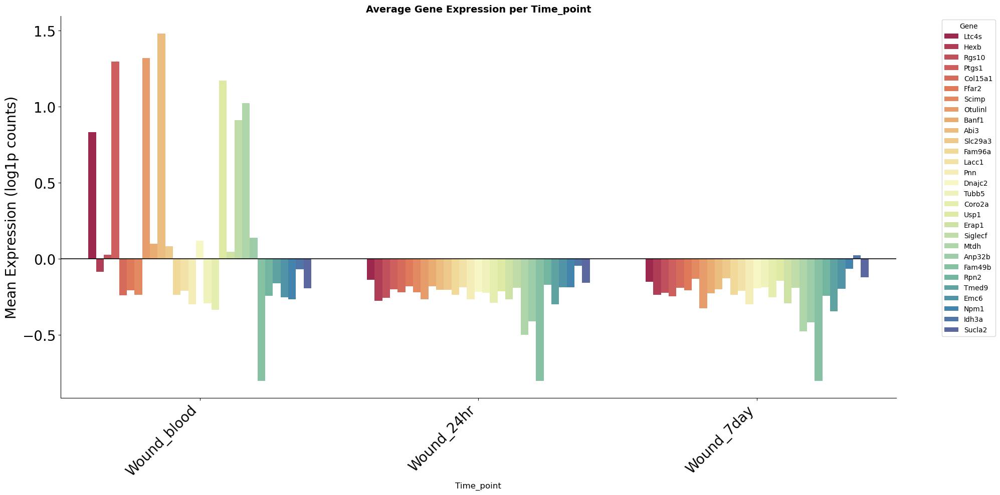

In [51]:
# --- Define your genes of interest ---
genes =['Ltc4s', 'Hexb', 'Rgs10', 'Ptgs1','Col15a1', 'Ffar2', 'Scimp', 'Otulinl', 
        'Banf1', 'Abi3', 'Slc29a3', 'Fam96a', 'Lacc1', 'Pnn', 'Dnajc2', 'Tubb5',
       'Coro2a', 'Usp1', 'Erap1', 'Siglecf', 'Mtdh', 'Anp32b', 'Fam49b', 'Rpn2',
       'Tmed9', 'Emc6', 'Npm1','Idh3a', 'Sucla2']

# --- Compute mean expression per cell for each gene ---
for gene in genes:
    wt.obs[f'mean_{gene}'] = wt[:, gene].X.toarray().mean(1)

# --- Aggregate by batch (mean per gene per batch) ---
df = wt.obs.groupby('time_point', as_index=False)[[f'mean_{g}' for g in genes]].mean()

# --- Melt to long format (so it's easy to plot with seaborn) ---
df_long = df.melt(id_vars='time_point', 
                  var_name='Gene', 
                  value_name='MeanExpression')

# --- Clean up the gene names (remove the 'mean_' prefix) ---
df_long['Gene'] = df_long['Gene'].str.replace('mean_', '')

# --- Define the order of batches (optional) ---
order = ['Wound_blood', 'Wound_24hr', 'Wound_7day']

# --- Plot grouped barplot ---
plt.figure(figsize=(20,10))
ax = sns.barplot(
    data=df_long,
    x='time_point', y='MeanExpression', hue='Gene',
    order=order,
    palette='Spectral'
)
plt.axhline(y=0, color='black', linewidth=1.2)
# --- Style it nicely ---
ax.set_title('Average Gene Expression per Time_point', fontsize=14, weight='bold')
ax.set_xlabel('Time_point', fontsize=12)
ax.set_ylabel('Mean Expression (log1p counts)', fontsize=20)
plt.xticks(rotation=45, ha='right',fontsize=20)
plt.yticks(fontsize=20)
plt.legend(title='Gene', bbox_to_anchor=(1.05, 1), loc='upper left')
sns.despine()
plt.tight_layout()
plt.show()

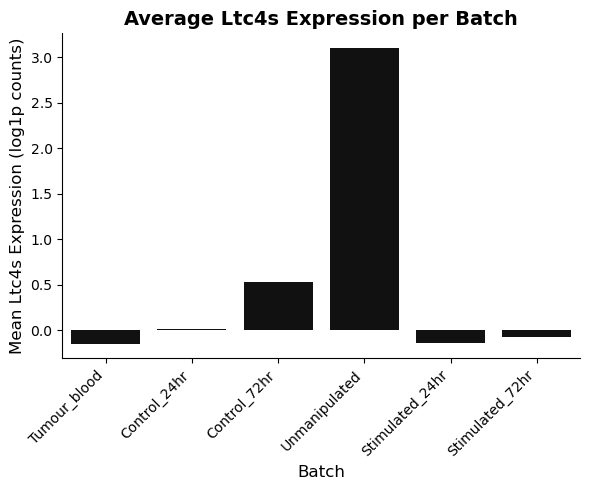

In [52]:
# --- Compute mean gene of interest expression per cell ---
wt.obs['mean_Ltc4s'] = wt[:, 'Ltc4s'].X.toarray().mean(1)

# --- Aggregate by batch ---
df = wt.obs.groupby('batch', as_index=False)['mean_Ltc4s'].mean()

# --- Sort batches in a logical order (optional) ---
order = ['Tumour_blood', 'Control_24hr', 'Control_72hr', 
         'Unmanipulated', 'Stimulated_24hr', 'Stimulated_72hr']

# --- Plot using seaborn for better aesthetics ---
plt.figure(figsize=(6,5))
ax = sns.barplot(data=df, x='batch', y='mean_Ltc4s', order=order, color='#111111')

# --- Improve appearance ---
ax.set_title('Average Ltc4s Expression per Batch', fontsize=14, weight='bold')
ax.set_xlabel('Batch', fontsize=12)
ax.set_ylabel('Mean Ltc4s Expression (log1p counts)', fontsize=12)
plt.xticks(rotation=45, ha='right')



sns.despine()
plt.tight_layout()
plt.show()

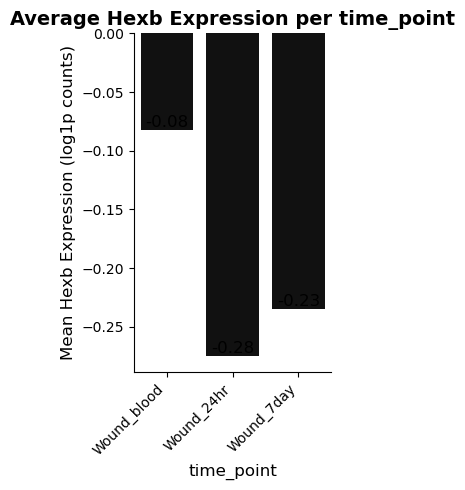

In [53]:
# --- Compute mean Ltc4s expression per cell ---
wt.obs['mean_Hexb'] = wt[:, 'Hexb'].X.toarray().mean(1)

# --- Aggregate by batch ---
df = wt.obs.groupby('time_point', as_index=False)['mean_Hexb'].mean()

# --- Sort batches in a logical order (optional) ---
order = ['Wound_blood', 'Wound_24hr', 'Wound_7day']

# --- Plot using seaborn for better aesthetics ---
plt.figure(figsize=(3,5))
ax = sns.barplot(data=df, x='time_point', y='mean_Hexb', order=order, color='#111111')

# --- Improve appearance ---
ax.set_title('Average Hexb Expression per time_point', fontsize=14, weight='bold')
ax.set_xlabel('time_point', fontsize=12)
ax.set_ylabel('Mean Hexb Expression (log1p counts)', fontsize=12)
plt.xticks(rotation=45, ha='right')

# --- Add value labels on top of each bar ---
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}', 
                (p.get_x() + p.get_width()/2., p.get_height()), 
                ha='center', va='bottom', fontsize=12)

sns.despine()
plt.tight_layout()
plt.show()

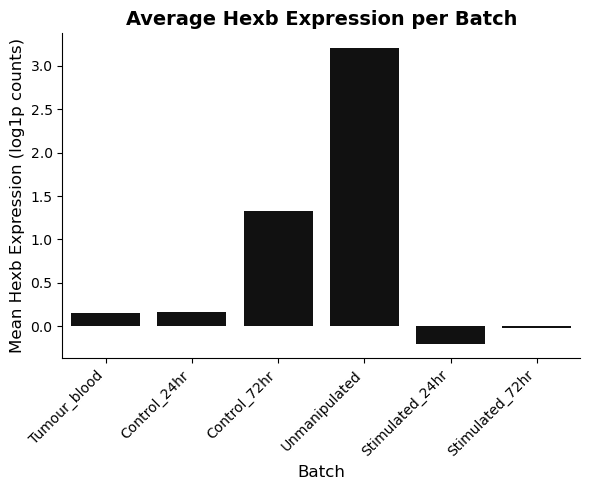

In [54]:
# --- Compute mean gene of interest expression per cell ---
wt.obs['mean_Hexb'] = wt[:, 'Hexb'].X.toarray().mean(1)

# --- Aggregate by batch ---
df = wt.obs.groupby('batch', as_index=False)['mean_Hexb'].mean()

# --- Sort batches in a logical order (optional) ---
order = ['Tumour_blood', 'Control_24hr', 'Control_72hr', 
         'Unmanipulated', 'Stimulated_24hr', 'Stimulated_72hr']

# --- Plot using seaborn for better aesthetics ---
plt.figure(figsize=(6,5))
ax = sns.barplot(data=df, x='batch', y='mean_Hexb', order=order, color='#111111')

# --- Improve appearance ---
ax.set_title('Average Hexb Expression per Batch', fontsize=14, weight='bold')
ax.set_xlabel('Batch', fontsize=12)
ax.set_ylabel('Mean Hexb Expression (log1p counts)', fontsize=12)
plt.xticks(rotation=45, ha='right')


sns.despine()
plt.tight_layout()
plt.show()


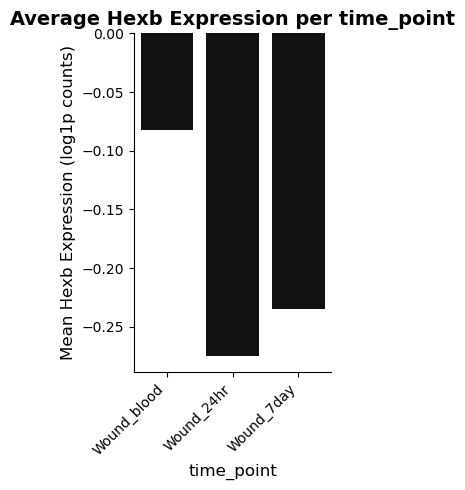

In [55]:
# --- Compute mean Ltc4s expression per cell ---
wt.obs['mean_Hexb'] = wt[:, 'Hexb'].X.toarray().mean(1)

# --- Aggregate by batch ---
df = wt.obs.groupby('time_point', as_index=False)['mean_Hexb'].mean()

# --- Sort batches in a logical order (optional) ---
order = ['Wound_blood', 'Wound_24hr', 'Wound_7day']

# --- Plot using seaborn for better aesthetics ---
plt.figure(figsize=(3,5))
ax = sns.barplot(data=df, x='time_point', y='mean_Hexb', order=order, color='#111111')

# --- Improve appearance ---
ax.set_title('Average Hexb Expression per time_point', fontsize=14, weight='bold')
ax.set_xlabel('time_point', fontsize=12)
ax.set_ylabel('Mean Hexb Expression (log1p counts)', fontsize=12)
plt.xticks(rotation=45, ha='right')


sns.despine()
plt.tight_layout()
plt.show()